<a href="https://colab.research.google.com/github/springboardmentor458/OBJECT_RECOGNITION_SYSTEM_Infosys_Internship_Oct2024/blob/Harsha-Kota/Springboard(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python-headless albumentations torch

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Use this if you need all those images in folder

In [ ]:
#Remove comments to run
"""
# Cell 1
import json
import cv2
import urllib.request
import numpy as np
import os

json_filename = '/content/drive/MyDrive/Colab Notebooks/instances_val2017.json'
with open(json_filename, 'r') as f:
    data = json.load(f)

output_dir = '/content/output_images'
os.makedirs(output_dir, exist_ok=True)

def download_and_save(image_url, annotations, filename):
    resp = urllib.request.urlopen(image_url)
    img_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    for ann in annotations:
        x, y, w, h = ann['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255, 0, 0), 2)
    output_path = os.path.join(output_dir, filename)
    cv2.imwrite(output_path, img)

for img_data in data['images']:
    img_id = img_data['id']
    img_url = img_data['coco_url']
    filename = img_data['file_name']
    annotations = [ann for ann in data.get('annotations', []) if ann['image_id'] == img_id]
    download_and_save(img_url, annotations, filename)

print(f"All images saved in {output_dir}")
"""

Use This for Direct Representations

In [ ]:
# Cell 1
import json
import cv2
import urllib.request
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

json_filename = '/content/drive/MyDrive/Colab Notebooks/instances_val2017.json'
with open(json_filename, 'r') as f:
    data = json.load(f)

def download_and_display(image_url, annotations, image=None):
    resp = urllib.request.urlopen(image_url)
    img_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

    if image is not None:
        img = image

    for ann in annotations:
        x, y, w, h = ann['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255, 0, 0), 2)

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Get the user input for the number of images to load
num_images = int(input("Enter the number of images to load (default is all): ") or len(data['images']))

original_images = []
original_annotations = []

for i, img_data in enumerate(data['images']):
    if i >= num_images:
        break
    img_id = img_data['id']
    img_url = img_data['coco_url']
    annotations = [ann for ann in data.get('annotations', []) if ann['image_id'] == img_id]
    original_images.append(img_url)
    original_annotations.append(annotations)
    download_and_display(img_url, annotations)

Image Processing Pipeline with Annotations and Visualization(Test 1)

In [ ]:
# Cell 2
import cv2
import numpy as np
from PIL import Image

def process_images(original_images, original_annotations):
    processed_images = []
    processed_annotations = []

    for img_url, annotations in zip(original_images, original_annotations):
        resp = urllib.request.urlopen(img_url)
        img_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

        # Filter images
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        binary_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

        # Resize images
        resized_img = cv2.resize(img, (224, 224))

        # Test for correct orientation
        height, width, _ = img.shape
        if height > width:
            rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
        else:
            rotated_img = img

        # Fix blurry images
        sharpened_img = cv2.GaussianBlur(rotated_img, (0, 0), sigmaX=1, sigmaY=1)
        sharpened_img = cv2.addWeighted(rotated_img, 1.5, sharpened_img, -0.5, 0)

        # Apply filters (e.g., black and white)
        bw_img = cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2GRAY)

        processed_images.extend([img, binary_img, resized_img, rotated_img, sharpened_img, bw_img])
        processed_annotations.extend([annotations] * 6)

    return processed_images, processed_annotations

# Call the processing function with the data from the previous cell
processed_images, processed_annotations = process_images(original_images, original_annotations)

# Display the processed images
for i, (img, annotations) in enumerate(zip(processed_images, processed_annotations)):
    download_and_display(original_images[i % len(original_images)], annotations, image=img)

Image Processing Pipeline with Annotations and Visualization(Test 2)

In [ ]:
# Cell 2
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

def process_and_display_images(original_images, original_annotations):
    def draw_annotations(image, annotations):
        # Create a copy of the image to avoid modifying the original
        annotated_img = image.copy()
        for ann in annotations:
            x, y, w, h = ann['bbox']
            cv2.rectangle(annotated_img,
                         (int(x), int(y)),
                         (int(x+w), int(y+h)),
                         (255, 0, 0), 2)
        return annotated_img

    def create_image_grid(images, titles, num_cols=3):
        num_images = len(images)
        num_rows = (num_images + num_cols - 1) // num_cols

        fig = plt.figure(figsize=(15, 5 * num_rows))
        gs = GridSpec(num_rows, num_cols, figure=fig)

        for idx, (img, title) in enumerate(zip(images, titles)):
            row = idx // num_cols
            col = idx % num_cols
            ax = fig.add_subplot(gs[row, col])

            if len(img.shape) == 2:  # If grayscale
                # Convert grayscale to BGR for annotation
                img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
                ax.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
            else:  # If color
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

            ax.set_title(title)
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    for img_url, annotations in zip(original_images, original_annotations):
        # Download and process each image
        resp = urllib.request.urlopen(img_url)
        img_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

        # Process images with different techniques
        processed_images = []
        titles = []

        # 1. Original Image with annotations
        annotated_original = draw_annotations(img, annotations)
        processed_images.append(annotated_original)
        titles.append('Original Image with Annotations')

        # 2. Binary Image with annotations
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        binary_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
        binary_img_color = cv2.cvtColor(binary_img, cv2.COLOR_GRAY2BGR)
        annotated_binary = draw_annotations(binary_img_color, annotations)
        processed_images.append(annotated_binary)
        titles.append('Binary Image with Annotations')

        # 3. Resized Image with annotations
        resized_img = cv2.resize(img, (224, 224))
        # Scale annotations for resized image
        scale_x = 224.0 / img.shape[1]
        scale_y = 224.0 / img.shape[0]
        scaled_annotations = []
        for ann in annotations:
            scaled_ann = ann.copy()
            x, y, w, h = ann['bbox']
            scaled_ann['bbox'] = [x * scale_x, y * scale_y, w * scale_x, h * scale_y]
            scaled_annotations.append(scaled_ann)
        annotated_resized = draw_annotations(resized_img, scaled_annotations)
        processed_images.append(annotated_resized)
        titles.append('Resized Image (224x224) with Annotations')

        # 4. Rotated Image with annotations (portrait orientation images will rotate.)
        height, width, _ = img.shape
        if height > width:              # If you want to rotate all images regardless of their orientation remove the line or adjust
            rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
            # Adjust annotations for rotation
            rotated_annotations = []
            for ann in annotations:
                rotated_ann = ann.copy()
                x, y, w, h = ann['bbox']
                rotated_ann['bbox'] = [y, width - x - w, h, w]
                rotated_annotations.append(rotated_ann)
            rotation_status = "Rotated 90°"
            annotated_rotated = draw_annotations(rotated_img, rotated_annotations)
        else:
            rotated_img = img
            rotation_status = "No Rotation Needed"
            annotated_rotated = draw_annotations(rotated_img, annotations)
        processed_images.append(annotated_rotated)
        titles.append(f'Orientation Check\n({rotation_status})')

        # 5. Sharpened Image with annotations
        sharpened_img = cv2.GaussianBlur(rotated_img, (0, 0), sigmaX=1, sigmaY=1)
        sharpened_img = cv2.addWeighted(rotated_img, 1.5, sharpened_img, -0.5, 0)
        annotated_sharpened = draw_annotations(sharpened_img,
                                             rotated_annotations if height > width else annotations)
        processed_images.append(annotated_sharpened)
        titles.append('Sharpened Image with Annotations')

        # 6. Black and White Image with annotations
        bw_img = cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2GRAY)
        bw_img_color = cv2.cvtColor(bw_img, cv2.COLOR_GRAY2BGR)
        annotated_bw = draw_annotations(bw_img_color,
                                      rotated_annotations if height > width else annotations)
        processed_images.append(annotated_bw)
        titles.append('Black & White Image with Annotations')

        # Display grid for current image
        create_image_grid(processed_images, titles)

# Usage:
processed_images, processed_annotations = process_and_display_images(original_images, original_annotations)

Custom PyTorch Dataset Class for COCO-style Object Detection

In [ ]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import json
import albumentations as A
from albumentations.pytorch import ToTensorV2
import multiprocessing

class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, img_dir, transform=None):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.img_dir = img_dir
        self.transform = transform
        self.image_id_to_annotations = self._group_annotations_by_image()
        print("COCO Dataset Class initialized successfully!")

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_path = os.path.join(self.img_dir, image_info['file_name'])

        # Load image
        try:
            image = cv2.imread(img_path)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                print(f"Successfully loaded image: {img_path}")
            else:
                raise FileNotFoundError(f"Image not found or failed to load: {img_path}")
        except Exception as e:
            print(f"Error loading image at {img_path}: {e}")
            return None, None

        # Get annotations
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])
        if not annotations:
            print(f"No annotations found for image ID {image_id}")
            return None, None

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])
            labels.append(self.category_mapping.get(ann['category_id'], -1))  # Default to -1 if not found

        # Convert boxes and labels to numpy arrays
        try:
            boxes = np.array(boxes, dtype=np.float32)
            labels = np.array(labels, dtype=np.int64)
        except ValueError as e:
            print(f"Error processing labels for image ID {image_id}: {e}")
            return None, None

        # Apply transformations
        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes, labels=labels)
            image = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']
        else:
            print(f"No transformations applied to image ID {image_id}")

        # Convert to PyTorch tensors
        if len(boxes) == 0 or len(labels) == 0:
            print(f"Warning: No valid boxes or labels for image ID {image_id}")
            return None, None

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        return image, target


# Load JSON file
with open('/content/drive/MyDrive/Colab Notebooks/instances_val2017.json', 'r') as f:
    try:
        coco_data = json.load(f)
        print("JSON file loaded successfully!")
    except json.JSONDecodeError as e:
        print(f"Error loading JSON file: {e}")
        coco_data = {}

images = coco_data.get('images', [])
annotations = coco_data.get('annotations', [])
categories = coco_data.get('categories', [])

if not images or not annotations or not categories:
    print("Warning: Missing data in COCO JSON.")
else:
    print(f"Loaded {len(images)} images, {len(annotations)} annotations, and {len(categories)} categories.")

# Map category IDs to numeric labels
category_mapping = {category['id']: idx for idx, category in enumerate(categories)}

# Augmentation and Preprocessing Pipeline
transform = A.Compose([
    A.Resize(height=416, width=416),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
    A.GaussianBlur(blur_limit=(3, 7), p=0.2),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1, p=0.3),
    A.ToGray(p=0.1),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

coco_dataset = CocoDataset(images, annotations, category_mapping, '/content/drive/MyDrive/Colab Notebooks/val2017', transform=transform)

# Adjust num_workers based on CPU count
num_workers = min(2, multiprocessing.cpu_count())
data_loader = DataLoader(coco_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: tuple(zip(*x)), num_workers=num_workers)

# Process DataLoader
num_valid_samples = 0
num_skipped_samples = 0
for images, targets in data_loader:
    if images is not None and targets is not None:
        print(f"Images batch size: {len(images)}")
        print(f"Target batch size: {len(targets)}")
        print("Sample target:", targets[0])
        num_valid_samples += len(images)
    else:
        num_skipped_samples += 1
        print(f"Skipping invalid sample ({num_skipped_samples})")

print(f"Total number of valid samples: {num_valid_samples}")
print(f"Total number of skipped samples: {num_skipped_samples}")


In [ ]:
#improved
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import json
import albumentations as A
from albumentations.pytorch import ToTensorV2
import multiprocessing
from tqdm import tqdm


class CocoDataset(Dataset):
    def __init__(self, images, annotations, category_mapping, img_dir, transform=None, input_size=(416, 416)):
        self.images = images
        self.annotations = annotations
        self.category_mapping = category_mapping
        self.img_dir = img_dir
        self.transform = transform
        self.input_size = input_size
        self.image_id_to_annotations = self._group_annotations_by_image()
        print(f"COCO Dataset initialized with {len(images)} images.")

    def _group_annotations_by_image(self):
        image_id_to_annotations = {}
        for ann in self.annotations:
            image_id = ann['image_id']
            if image_id not in image_id_to_annotations:
                image_id_to_annotations[image_id] = []
            image_id_to_annotations[image_id].append(ann)
        return image_id_to_annotations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        img_path = os.path.join(self.img_dir, image_info['file_name'])

        # Load and preprocess image
        try:
            image = cv2.imread(img_path)
            if image is None:
                raise FileNotFoundError(f"Image not found: {img_path}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            return None, None

        # Get original image size
        original_size = image.shape[:2]

        # Resize image dynamically to the input size
        image = cv2.resize(image, (self.input_size[1], self.input_size[0]))

        # Get annotations for the image
        image_id = image_info['id']
        annotations = self.image_id_to_annotations.get(image_id, [])
        if not annotations:
            return None, None

        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            # Convert bbox to format (xmin, ymin, xmax, ymax)
            boxes.append([x, y, x + width, y + height])
            labels.append(self.category_mapping.get(ann['category_id'], -1))

        try:
            boxes = np.array(boxes, dtype=np.float32)
            labels = np.array(labels, dtype=np.int64)
        except ValueError as e:
            print(f"Invalid data for image ID {image_id}: {e}")
            return None, None

        # Normalize bounding boxes relative to the resized image
        image_height, image_width = image.shape[:2]
        boxes[:, [0, 2]] /= image_width  # Normalize x-min and x-max
        boxes[:, [1, 3]] /= image_height  # Normalize y-min and y-max

        # Apply augmentations
        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes, labels=labels)
            image = transformed['image']
            boxes = transformed['bboxes']
            labels = transformed['labels']

        # Convert to PyTorch tensors
        if len(boxes) == 0 or len(labels) == 0:
            return None, None
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels, "original_size": torch.tensor(original_size)}

        return image, target


# Load and parse JSON
def load_coco_json(json_path):
    try:
        with open(json_path, 'r') as f:
            coco_data = json.load(f)
        print("JSON file loaded successfully!")
        return coco_data
    except Exception as e:
        print(f"Error loading JSON file: {e}")
        return None


# Automatically detect GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# Augmentation and Preprocessing
def get_augmentation_pipeline(mode='train'):
    if mode == 'train':
        return A.Compose([
            A.Resize(416, 416),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.2),  # New
            A.Rotate(limit=10, p=0.5),
            A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),  # New
            A.RandomResizedCrop(416, 416, scale=(0.8, 1.0), ratio=(0.75, 1.33), p=0.5),  # New
            A.GaussianBlur(blur_limit=(3, 5), p=0.2),  # New
            A.GridDistortion(p=0.3),  # New
            A.Perspective(scale=(0.05, 0.1), p=0.3),  # New
            A.CoarseDropout(max_holes=8, max_height=32, max_width=32, fill_value=0, p=0.5),  # New
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
    elif mode == 'val':
        return A.Compose([
            A.Resize(416, 416),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))


# Load data
json_path = '/content/drive/MyDrive/Colab Notebooks/instances_val2017.json'
coco_data = load_coco_json(json_path)
if coco_data:
    images = coco_data.get('images', [])
    annotations = coco_data.get('annotations', [])
    categories = coco_data.get('categories', [])
    category_mapping = {category['id']: idx for idx, category in enumerate(categories)}

    coco_dataset = CocoDataset(
        images,
        annotations,
        category_mapping,
        '/content/drive/MyDrive/Colab Notebooks/val2017',
        transform=get_augmentation_pipeline('train')
    )

    # Dynamic Batch Sizing
    memory_limit = torch.cuda.get_device_properties(0).total_memory // (1024 ** 3) if torch.cuda.is_available() else 8  # Default 8GB for CPU
    batch_size = min(max(4, memory_limit // 2), 16)  # Dynamic batch size between 4 and 16
    print(f"Using dynamic batch size: {batch_size}")

    # DataLoader
    num_workers = min(2, multiprocessing.cpu_count())
    data_loader = DataLoader(
        coco_dataset,
        batch_size=batch_size,
        shuffle=True,
        collate_fn=lambda x: tuple(zip(*x)),
        num_workers=num_workers
    )

    # Process DataLoader with progress tracking
    valid_samples = 0
    skipped_samples = 0
    for batch in tqdm(data_loader, desc="Processing DataLoader"):
        images, targets = batch
        if images is not None and targets is not None:
            valid_samples += len(images)
            print(f"Processed batch: {len(images)} images")
        else:
            skipped_samples += 1

    print(f"Valid samples: {valid_samples}")
    print(f"Skipped samples: {skipped_samples}")
else:
    print("Failed to load COCO data.")


Faster RCNN Model

In [ ]:
# Install necessary libraries
!pip install torch torchvision -q
!pip install matplotlib -q

In [ ]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import json

# Define custom dataset class
class CustomDataset(Dataset):
    def __init__(self, image_dir, annotation_file, transforms=None):
        self.image_dir = image_dir
        self.annotations = self.load_annotations(annotation_file)
        self.transforms = transforms
        self.category_mapping = {category['id']: idx for idx, category in enumerate(self.annotations['categories'])}

    def load_annotations(self, annotation_file):
        with open(annotation_file, 'r') as f:
            return json.load(f)

    def __len__(self):
        return len(self.annotations['images'])

    def __getitem__(self, idx):
        data = self.annotations['images'][idx]
        img_path = os.path.join(self.image_dir, data['file_name'])
        image = Image.open(img_path).convert("RGB")

        # Get the annotations for this image
        annotations = [ann for ann in self.annotations['annotations'] if ann['image_id'] == data['id']]

        # Convert bounding boxes and labels
        boxes = []
        labels = []
        for ann in annotations:
            x, y, width, height = ann['bbox']
            boxes.append([x, y, x + width, y + height])  # [x1, y1, x2, y2]
            labels.append(self.category_mapping.get(ann['category_id'], -1))  # Map category_id to index

        if len(boxes) == 0:  # Skip images with no annotations
            return self.__getitem__((idx + 1) % len(self))  # Recursively get a valid item

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        target = {"boxes": boxes, "labels": labels}

        if self.transforms:
            image = self.transforms(image)

        return image, target

# Paths to images and annotations
image_dir = "/content/drive/MyDrive/Colab Notebooks/val2017"
annotation_file = "/content/drive/MyDrive/Colab Notebooks/instances_val2017.json"

# Dataset and DataLoader
dataset = CustomDataset(image_dir, annotation_file, transforms=torchvision.transforms.ToTensor())
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Load a pre-trained Faster R-CNN model and modify it for custom data
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

# Initialize the model
num_classes = 91  # This is usually 80 for COCO + 1 for background (modify if needed for your dataset)
model = get_model(num_classes)

# Training setup
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
num_epochs = 5
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/faster_rcnn_checkpoint.pth"

# Function to save checkpoint
def save_checkpoint(epoch, model, optimizer, path):
    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict()
    }
    torch.save(checkpoint, path)
    print(f"Checkpoint saved at epoch {epoch + 1}")

# Function to load checkpoint
def load_checkpoint(path, model, optimizer):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    checkpoint = torch.load(path, map_location=device)  # Map to the correct device
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    start_epoch = checkpoint["epoch"]
    print(f"Checkpoint loaded. Resuming from epoch {start_epoch + 1}")
    return start_epoch

# Load checkpoint if it exists
start_epoch = 0
if os.path.exists(checkpoint_path):
    start_epoch = load_checkpoint(checkpoint_path, model, optimizer)

# Mixed Precision Training Setup (Optional)
scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

# Training loop with saving progress
for epoch in range(start_epoch, num_epochs):
    print(f"Starting Epoch {epoch + 1}/{num_epochs}...")
    model.train()
    epoch_loss = 0
    for batch_idx, (images, targets) in enumerate(data_loader):
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()

        # Mixed Precision Training (if using GPU)
        if scaler:
            with torch.cuda.amp.autocast():
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            losses.backward()
            optimizer.step()

        epoch_loss += losses.item()
        print(f"Epoch {epoch + 1}, Batch {batch_idx + 1}/{len(data_loader)}, Loss: {losses.item():.4f}")

    print(f"Epoch {epoch + 1} completed. Total Loss: {epoch_loss:.4f}\n")
    save_checkpoint(epoch, model, optimizer, checkpoint_path)

# Save the final model
model_save_path = "/content/drive/MyDrive/Colab Notebooks/faster_rcnn_model.pth"
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 118MB/s]
<ipython-input-3-ccfc1b2e9657>:95: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value)

Checkpoint loaded. Resuming from epoch 3
Starting Epoch 3/5...
Epoch 3, Batch 1/2500, Loss: 0.2773
Epoch 3, Batch 2/2500, Loss: 0.7059


KeyboardInterrupt: 

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 173MB/s]
<ipython-input-8-1bb9d0d8c9fa>:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you

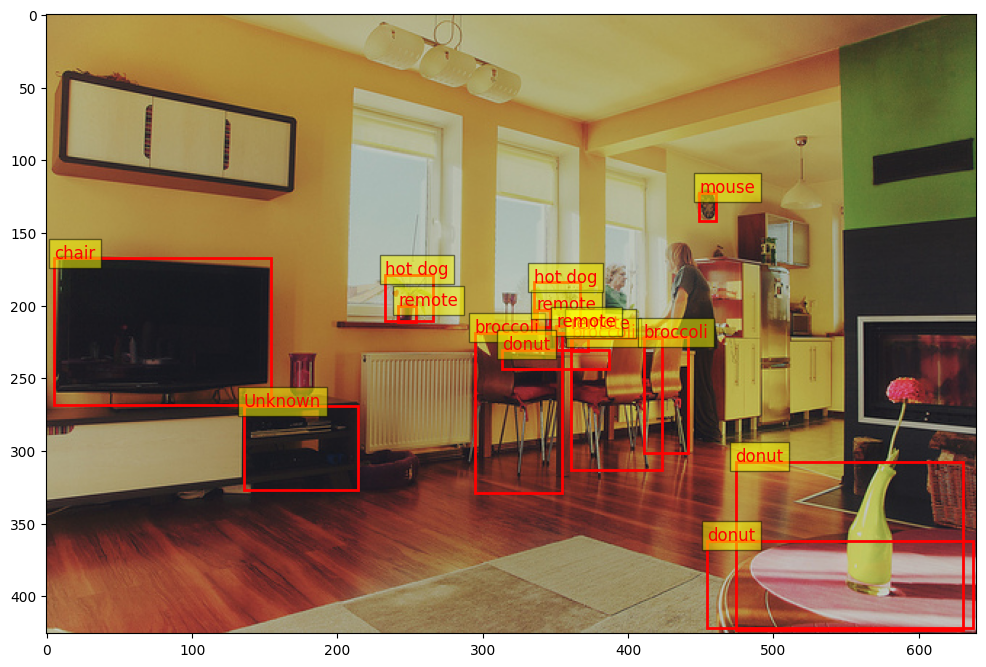

In [ ]:
import torch
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt
import json
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision

# Redefine the get_model function
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")  # Updated for latest torchvision version
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_save_path = "/content/drive/MyDrive/Colab Notebooks/faster_rcnn_model.pth"  # Corrected model path
num_classes = 91  # Make sure this matches the training configuration
model = get_model(num_classes)  # Initialize the model
model.load_state_dict(torch.load(model_save_path, map_location=device))  # Load the model weights
model.to(device)
model.eval()

# Load class names from JSON
def load_class_names(annotation_file):
    with open(annotation_file, 'r') as f:
        annotations = json.load(f)
    return {category['id']: category['name'] for category in annotations['categories']}

# Load class names mapping
annotation_file = "/content/drive/MyDrive/Colab Notebooks/instances_val2017.json"  # Path to your JSON file
class_names = load_class_names(annotation_file)

# Test the model on a sample image
def test_model(image_path):
    # Open the image
    image = Image.open(image_path).convert("RGB")

    # Apply the same transformations as during training (ToTensor)
    transform = T.Compose([T.ToTensor()])
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        prediction = model(image_tensor)

    # Extract boxes, labels, and scores
    boxes = prediction[0]['boxes'].cpu().numpy()
    labels = prediction[0]['labels'].cpu().numpy()
    scores = prediction[0]['scores'].cpu().numpy()

    # Filter out predictions with low confidence (optional, set a threshold for confidence score)
    threshold = 0.5
    valid_boxes = boxes[scores >= threshold]
    valid_labels = labels[scores >= threshold]

    # Plot the image and draw bounding boxes
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Draw bounding boxes on the image
    for box, label in zip(valid_boxes, valid_labels):
        x1, y1, x2, y2 = box
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Use the class name from the mapping
        class_name = class_names.get(label, "Unknown")
        ax.text(x1, y1, f"{class_name}", color='red', fontsize=12, bbox=dict(facecolor='yellow', alpha=0.5))

    plt.show()

# Example of testing the model on a sample image
test_image_path = "/content/drive/MyDrive/Colab Notebooks/val2017/000000000139.jpg"  # Update this path
test_model(test_image_path)


Masked RCNN

In [ ]:
!pip install torch torchvision matplotlib opencv-python tqdm -q albumentations

Using device: cuda
loading annotations into memory...
Done (t=1.22s)
creating index...
index created!
Epoch 1/3


Training Epoch 1: 100%|██████████| 500/500 [09:17<00:00,  1.11s/it, batch_loss=1.5]


Epoch 1 completed. Average Loss: 1.9834
Displaying training samples with bounding boxes...


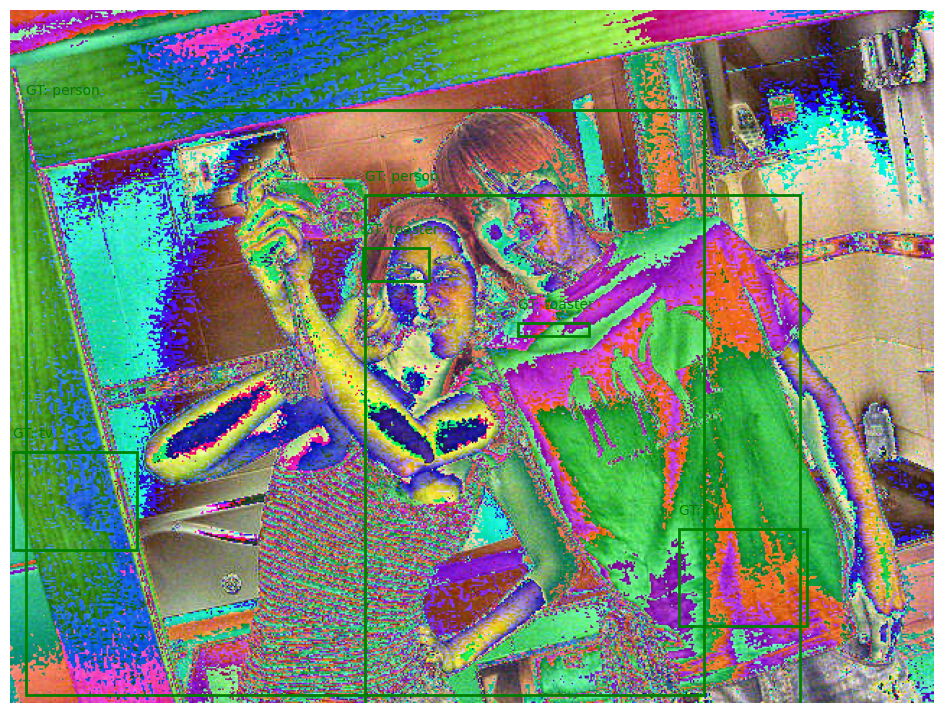

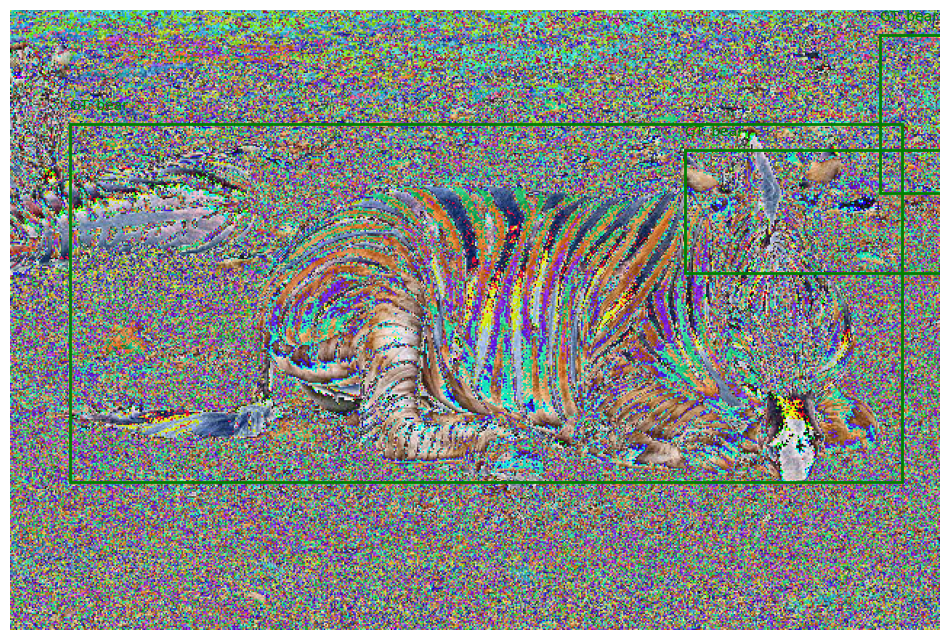

Epoch 2/3


Training Epoch 2: 100%|██████████| 500/500 [06:22<00:00,  1.31it/s, batch_loss=1.47]


Epoch 2 completed. Average Loss: 1.7908
Displaying training samples with bounding boxes...


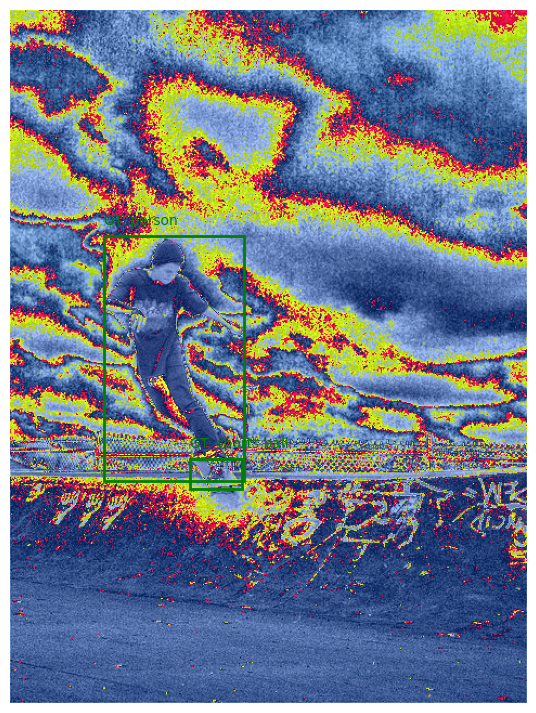

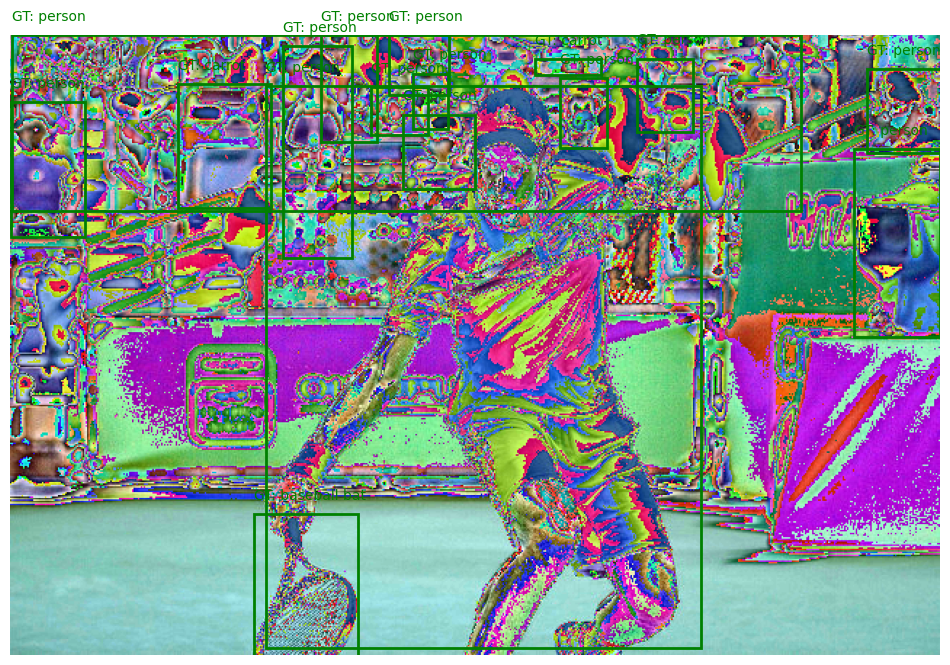

Epoch 3/3


Training Epoch 3: 100%|██████████| 500/500 [06:20<00:00,  1.31it/s, batch_loss=2.1]


Epoch 3 completed. Average Loss: 1.7583
Displaying training samples with bounding boxes...


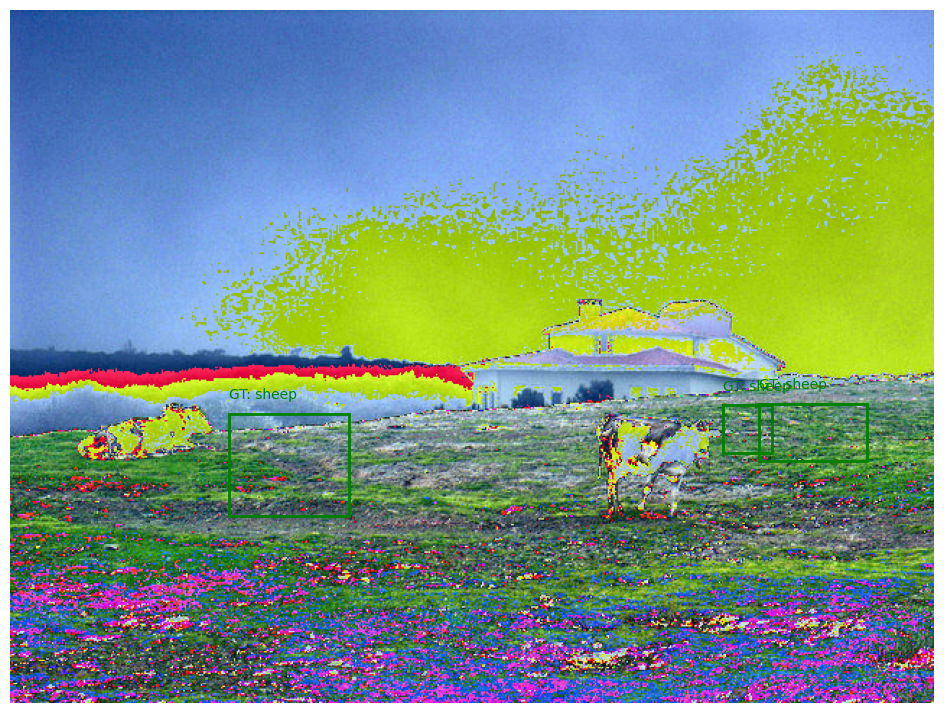

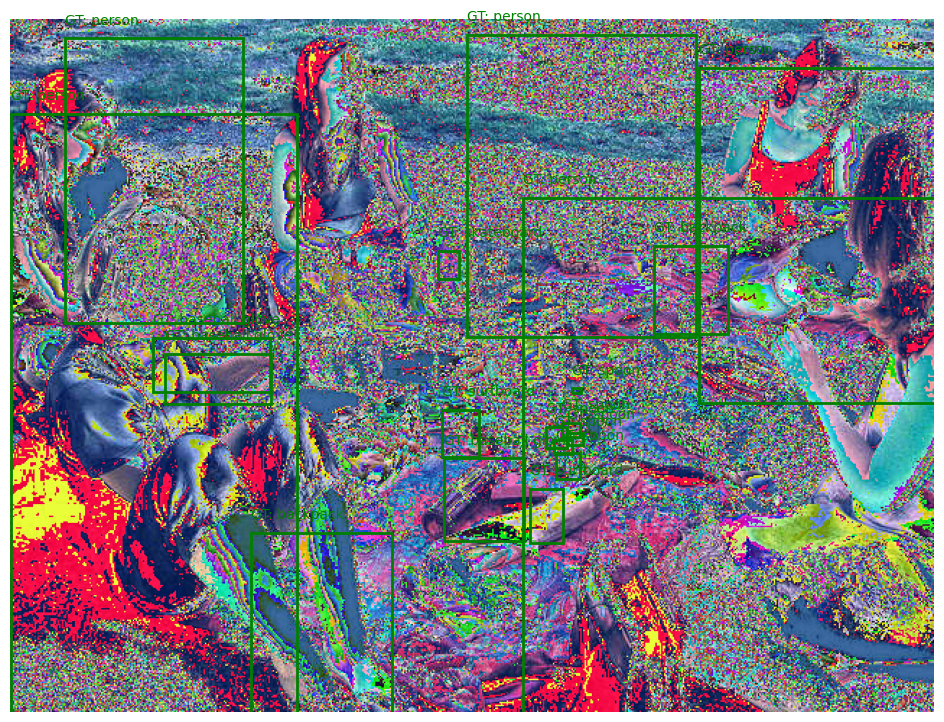

Model saved to /content/drive/MyDrive/Colab Notebooks/mask_rcnn_model.pth


In [ ]:
import os
import random
import torch
import torchvision
from torchvision.transforms import ToTensor, Compose, RandomHorizontalFlip
from torch.utils.data import DataLoader
from pycocotools.coco import COCO
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

# Define Dataset Class
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation_file, transforms=None, max_samples=None):
        self.root = root
        self.transforms = transforms
        self.coco = COCO(annotation_file)
        self.class_names = self._load_class_names()
        self.category_id_to_label = {cat_id: idx + 1 for idx, cat_id in enumerate(sorted(self.class_names.keys()))}
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.ids = [img_id for img_id in self.ids if len(self.coco.getAnnIds(imgIds=[img_id])) > 0]

        if max_samples:
            self.ids = random.sample(self.ids, max_samples)

    def _load_class_names(self):
        categories = self.coco.loadCats(self.coco.getCatIds())
        return {cat['id']: cat['name'] for cat in categories}

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        annotation = self.coco.loadAnns(self.coco.getAnnIds(imgIds=[img_id]))
        img_path = os.path.join(self.root, self.coco.imgs[img_id]['file_name'])
        img = Image.open(img_path).convert("RGB")

        boxes = []
        labels = []
        masks = []
        for anno in annotation:
            xmin, ymin, width, height = anno['bbox']
            boxes.append([xmin, ymin, xmin + width, ymin + height])
            labels.append(self.category_id_to_label[anno['category_id']])
            masks.append(self.coco.annToMask(anno))

        if not boxes:
            return self.__getitem__((idx + 1) % len(self.ids))

        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
            "masks": torch.stack([torch.tensor(mask, dtype=torch.uint8) for mask in masks])
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.ids)

# Define Model
def get_mask_rcnn_model(num_classes):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="COCO_V1")

    # Only modify the head
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )
    return model

# Visualization Function
def visualize_sample(images, targets, predictions=None, class_names=None):
    """Display images with ground truth and predictions."""
    for img, target in zip(images, targets):
        img = img.permute(1, 2, 0).cpu().numpy()  # Convert to HWC
        img = (img * 255).astype('uint8')  # De-normalize

        fig, ax = plt.subplots(1, figsize=(12, 9))
        ax.imshow(img)

        # Plot Ground Truth
        for box, label in zip(target['boxes'], target['labels']):
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='green', facecolor='none')
            ax.add_patch(rect)
            label_name = class_names[label.item()] if class_names else f"Label {label.item()}"
            ax.text(x1, y1 - 10, f"GT: {label_name}", color='green', fontsize=10)

        plt.axis('off')
        plt.show()

# Training Function
def train_model(model, data_loader, device, optimizer, scheduler, num_epochs=3, class_names=None):
    model.to(device)
    max_grad_norm = 1.0  # Gradient clipping threshold

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        print(f"Epoch {epoch+1}/{num_epochs}")
        epoch_progress = tqdm(data_loader, desc=f"Training Epoch {epoch+1}")

        for batch_idx, (images, targets) in enumerate(epoch_progress):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            total_loss += losses.item()

            optimizer.zero_grad()
            losses.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            epoch_progress.set_postfix(batch_loss=losses.item())

        avg_loss = total_loss / len(data_loader)
        print(f"Epoch {epoch+1} completed. Average Loss: {avg_loss:.4f}")

        # Display a sample batch for visualization
        if epoch % 1 == 0:  # Every epoch
            print("Displaying training samples with bounding boxes...")
            visualize_sample(images, targets, class_names=class_names)

        scheduler.step()

    return model

# Save Model
def save_model(model, filename):
    torch.save(model.state_dict(), filename)
    print(f"Model saved to {filename}")

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    root_dir = "/content/drive/MyDrive/Colab Notebooks/val2017"
    annotation_file = "/content/drive/MyDrive/Colab Notebooks/instances_val2017.json"

    transform = Compose([
        RandomHorizontalFlip(),
        ToTensor(),
        torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    dataset = CustomDataset(
        root=root_dir,
        annotation_file=annotation_file,
        transforms=transform,
        max_samples=1000
    )
    data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

    num_classes = len(dataset.class_names) + 1
    model = get_mask_rcnn_model(num_classes)

    optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.1)

    # Train the model
    trained_model = train_model(model, data_loader, device, optimizer, scheduler, num_epochs=3, class_names=dataset.class_names)

    # Save the trained model
    save_model(trained_model, "/content/drive/MyDrive/Colab Notebooks/mask_rcnn_model.pth")


<ipython-input-19-d264c666e1e2>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/mask_rcnn_model.pt

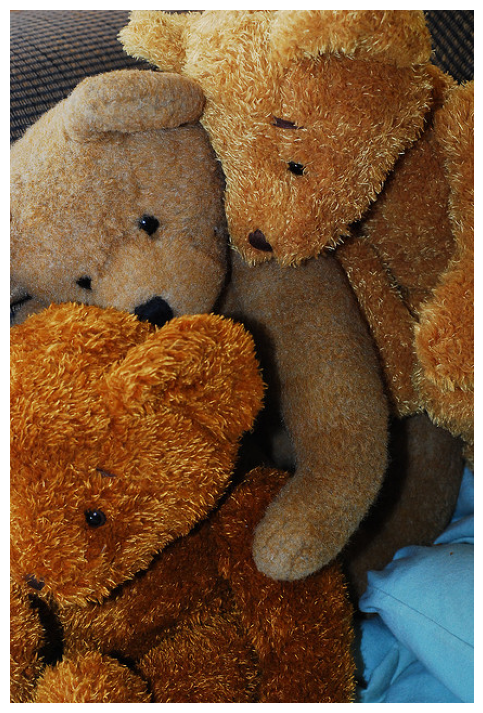

In [ ]:
import torch
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt
import json
import torchvision
import os

def get_inference_model(num_classes):
    # Load a pre-trained Mask R-CNN model
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="COCO_V1")

    # Modify the classifier and mask predictor layers for custom classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )

    return model

def load_class_names(annotation_file):
    # Load class names from the annotation file (COCO-style)
    with open(annotation_file, 'r') as f:
        annotations = json.load(f)

    categories = {category['id']: category['name'] for category in annotations['categories']}
    category_id_to_label = {cat_id: idx for idx, cat_id in enumerate(sorted(categories.keys()))}
    label_to_category_id = {v: k for k, v in category_id_to_label.items()}

    return categories, label_to_category_id

def test_model(model, image_path, categories, label_to_category_id, device):
    # Load and transform the image for inference
    image = Image.open(image_path).convert("RGB")
    transform = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)

    # Get bounding boxes, labels, and scores
    boxes = prediction[0]['boxes'].cpu().numpy()
    labels = prediction[0]['labels'].cpu().numpy()
    scores = prediction[0]['scores'].cpu().numpy()
    masks = prediction[0]['masks'].cpu().numpy()

    # Apply threshold to filter detections
    threshold = 0.5  # Adjusted threshold
    valid_indices = scores >= threshold
    valid_boxes = boxes[valid_indices]
    valid_labels = labels[valid_indices]
    valid_scores = scores[valid_indices]
    valid_masks = masks[valid_indices]

    # Plot the results
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Loop over the valid detections and display bounding boxes and class names
    for box, label, score, mask in zip(valid_boxes, valid_labels, valid_scores, valid_masks):
        x1, y1, x2, y2 = box
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Adjust label index to match the training data
        class_name = categories[label - 1]  # Correct label indexing
        ax.text(x1, y1 - 10, f"{class_name}: {score:.2f}", color='red', fontsize=12)

        # Optionally display the mask if available
        mask = mask[0] > 0.5  # Create a binary mask
        ax.imshow(mask, alpha=0.3, cmap="jet")

    plt.axis('off')
    plt.show()

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load class names and the number of classes from your dataset's annotation file
    annotation_file = "/content/drive/MyDrive/Colab Notebooks/instances_val2017.json"  # Path to your annotation file
    categories, label_to_category_id = load_class_names(annotation_file)
    num_classes = len(categories) + 1  # Account for the background class

    # Load the trained Mask R-CNN model
    model = get_inference_model(num_classes)
    model.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/mask_rcnn_model.pth"))  # Path to your trained model
    model.to(device)

    # Test the model with an image
    test_image_path = "/content/drive/MyDrive/Colab Notebooks/val2017/000000000776.jpg"  # Correct path to a test image
    test_model(model, test_image_path, categories, label_to_category_id, device)
